In [1]:
from preprocess import get_hinge_features
from preprocess import get_chain_code_features
from preprocess import preprocessing

import numpy as np
import pandas as pd
from PIL import Image
import imagehash
import cv2
from tqdm import tqdm 

from skimage.measure import compare_ssim
import matplotlib.pyplot as plt
from PIL import Image
import warnings
warnings.filterwarnings(action='ignore')

In [36]:
#크기가 같은 (1 , n) vector간의 유클리드 유사도 구하기 : RMSE(너무 작아져서 길이는 뺌)
#def dist(x,y):   
    #return np.sqrt(np.sum((x-y)**2))

In [10]:
from numpy import dot
from numpy.linalg import norm
#코사인 유사도
def dist(A, B):
       return dot(A, B)/(norm(A)*norm(B))

#FOR CNN  
1. 원본이미지와 블러 이미지의 유사도  
2. 성별에 따른 벡터들의 차이
2. 원본과 cut한 이미지의 hinge , chain 벡터 유사도  
1) 4등분한 이미지의 hinge 벡터 유사도  
 2) 4등분한 이미지의 chain 벡터 유사도
4. 좌우반전 한 이미지의 유사도

1번 테스트  
참고)https://soooprmx.com/opencv%EB%A5%BC-%EC%82%AC%EC%9A%A9%ED%95%98%EC%97%AC-%EB%91%90-%EC%9D%B4%EB%AF%B8%EC%A7%80%EC%9D%98-%EB%8B%A4%EB%A5%B8-%EB%B6%80%EB%B6%84-%EC%B0%BE%EA%B8%B0/

높을 수록 좋음 %

원본 과 블러 유사도 : 0.9604956891410881


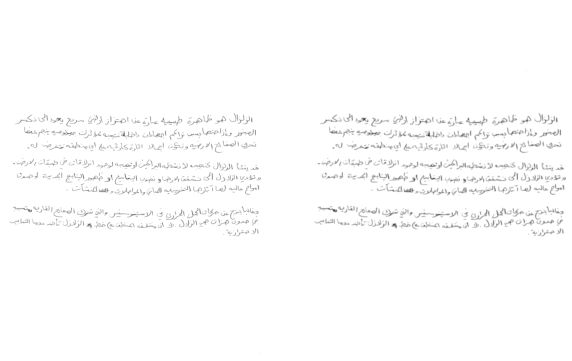

In [47]:
# test1
img1 = cv2.imread('new/0001_2.jpg', cv2.IMREAD_GRAYSCALE)
img1_blur = cv2.GaussianBlur(img1,(0,0),3) #필터(0,0)으로 하면 sigma에 따라 알아서 정해줌
#score은 유사도 점수 , diff는 차이가 나는 영역 , 가우시안 필터를 사용하는 것만 앎
score1, diff1 = compare_ssim(img1, img1_blur, full=True)
print('원본 과 블러 유사도 : ' +  str(score1))


plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(img1,cmap='gray')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(img1_blur,cmap='gray')
plt.axis('off')
plt.show()

원본 과 블러 유사도 : 0.9756708141149437


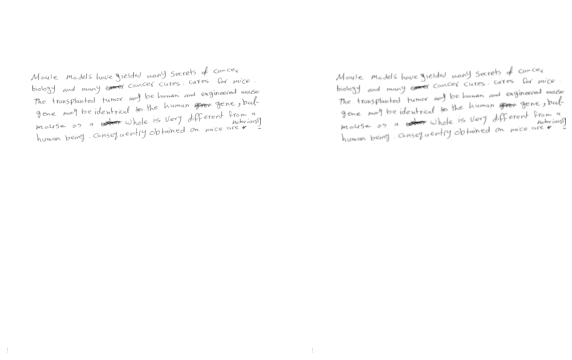

In [46]:
# test2
img2 = cv2.imread('new/0001_3.jpg', cv2.IMREAD_GRAYSCALE)
img2_blur = cv2.GaussianBlur(img2,(0,0),3)
score2, diff2 = compare_ssim(img2, img2_blur, full=True)
print('원본 과 블러 유사도 : ' + str(score2))

plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(img2,cmap='gray')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(img2_blur,cmap='gray')
plt.axis('off')
plt.show()

원본 과 블러 유사도 : 0.7851093186294273


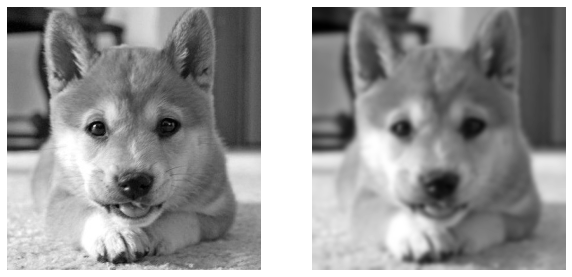

In [48]:
#개 사진으로 test
img_dog = cv2.imread('test_image/dog.jpg', cv2.IMREAD_GRAYSCALE)
img_dog_blur = cv2.GaussianBlur(img_dog,(0,0),3)
score_dog, diff_dog = compare_ssim(img_dog, img_dog_blur, full=True)
print('원본 과 블러 유사도 : ' + str(score_dog))

plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(img_dog,cmap='gray')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(img_dog_blur,cmap='gray')
plt.axis('off')
plt.show()

1번 결론 : CNN은 좀 더 자세히 볼 순 있겠지만 기본적으로 차이가 발생하지 않음  
그렇다고 sigma를 높이면 정보손실이 크기 때문에 블러는 사용하지 않는다

vector를 추출하는 과정에서 가우시안 필터를 한번 사용하기 때문에 자체적으로 blur효과가 들어감  
이중 블러를 사용하므로 정보 손실이 생길듯?

vetor 추출

In [24]:
from_path = 'new_cut/'

feature_list = []

for i in tqdm(range(1,476)):
    for j in range(1,5):
        image_path = str(i).zfill(4) + '_' + str(j) +'.jpg'
        #흑백으로 불러오기
        img = cv2.imread(from_path + image_path, cv2.IMREAD_GRAYSCALE)
        #이진화 
        img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)
        
        chain = get_chain_code_features(img)[0]
        hinge = get_hinge_features(img)   
        if np.isfinite(chain).all()==False or np.isfinite(hinge).all()==False:
            print(i,j)
        feature_list.append(np.concatenate((chain,hinge),axis=0))

                     
feature_list = np.array(feature_list)
print(feature_list.shape)
np.save('new_cut_feature.npy',feature_list)

100%|██████████| 475/475 [47:20<00:00,  5.98s/it]

(1900, 138)


vector 유사도 비교  낮을 수록 좋음 RMSE

In [169]:
test_vector1 = np.array([1 for _ in range(100)])
test_vector2 = np.array([0 for _ in range(100)])
print('1벡터와 0벡터 유사도 : ' + str(dist(test_vector1,test_vector2)))

1벡터와 0벡터 유사도 : nan


---------------------label이 다른 사진의 유사도 차이---------------------

In [170]:
#test1 여자 vs 남자
#여자
img1 = cv2.imread('new/0078_4.jpg', cv2.IMREAD_GRAYSCALE)
img1 = cv2.adaptiveThreshold(img1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)

#남자
img2 = cv2.imread('new/0079_4.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.adaptiveThreshold(img2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)

img1_chain = get_chain_code_features(img1)[0]
img2_chain = get_chain_code_features(img2)[0]

img1_hinge = get_hinge_features(img1)
img2_hinge = get_hinge_features(img2)

print('여자 와 남자 chain vector 유사도 : ' +  str(dist(img1_chain,img2_chain)))
print('여자 와 남자 hinge vector 유사도 : ' +  str(dist(img1_hinge,img2_hinge)))
print('여자 와 남자 chain+hinge vector 유사도 : ' +  
      str(dist(np.concatenate([img1_chain,img1_hinge], axis=0),
               np.concatenate([img2_chain,img2_hinge], axis=0))))

여자 와 남자 chain vector 유사도 : 0.9796783010080544
여자 와 남자 hinge vector 유사도 : 0.9524267210381335
여자 와 남자 chain+hinge vector 유사도 : 0.9795720295497148


In [171]:
#test2 여자vs남자
#여자
img1 = cv2.imread('new/0085_4.jpg', cv2.IMREAD_GRAYSCALE)
img1 = cv2.adaptiveThreshold(img1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)

#남자
img2 = cv2.imread('new/0086_4.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.adaptiveThreshold(img2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)

img1_chain = get_chain_code_features(img1)[0]
img2_chain = get_chain_code_features(img2)[0]

img1_hinge = get_hinge_features(img1)
img2_hinge = get_hinge_features(img2)

print('여자 와 남자 chain vector 유사도 : ' +  str(dist(img1_chain,img2_chain)))
print('여자 와 남자 hinge vector 유사도 : ' +  str(dist(img1_hinge,img2_hinge)))
print('여자 와 남자 chain+hinge vector 유사도 : ' +  
      str(dist(np.concatenate([img1_chain,img1_hinge], axis=0),
               np.concatenate([img2_chain,img2_hinge], axis=0))))

여자 와 남자 chain vector 유사도 : 0.941986467173239
여자 와 남자 hinge vector 유사도 : 0.843484545061854
여자 와 남자 chain+hinge vector 유사도 : 0.9415931287898485


In [172]:
#test3 : 여자vs여자
#여자
img1 = cv2.imread('new/0084_4.jpg', cv2.IMREAD_GRAYSCALE)
img1 = cv2.adaptiveThreshold(img1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)

#여자
img2 = cv2.imread('new/0085_4.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.adaptiveThreshold(img2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)

img1_chain = get_chain_code_features(img1)[0]
img2_chain = get_chain_code_features(img2)[0]

img1_hinge = get_hinge_features(img1)
img2_hinge = get_hinge_features(img2)

print('여자 와 여자 chain vector 유사도 : ' +  str(dist(img1_chain,img2_chain)))
print('여자 와 여자 hinge vector 유사도 : ' +  str(dist(img1_hinge,img2_hinge)))
print('여자 와 여자 chain+hinge vector 유사도 : ' +  
      str(dist(np.concatenate([img1_chain,img1_hinge], axis=0),
               np.concatenate([img2_chain,img2_hinge], axis=0))))

여자 와 여자 chain vector 유사도 : 0.9418524029989256
여자 와 여자 hinge vector 유사도 : 0.8893752680085236
여자 와 여자 chain+hinge vector 유사도 : 0.9417197685547611


In [173]:
#test4 : 남자 vs남자
#남자
img1 = cv2.imread('new/0101_4.jpg', cv2.IMREAD_GRAYSCALE)
img1 = cv2.adaptiveThreshold(img1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)

#남자
img2 = cv2.imread('new/0102_4.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.adaptiveThreshold(img2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)

img1_chain = get_chain_code_features(img1)[0]
img2_chain = get_chain_code_features(img2)[0]

img1_hinge = get_hinge_features(img1)
img2_hinge = get_hinge_features(img2)

print('남자 와 남자 chain vector 유사도 : ' +  str(dist(img1_chain,img2_chain)))
print('남자 와 남자 hinge vector 유사도 : ' +  str(dist(img1_hinge,img2_hinge)))
print('남자 와 남자 chain+hinge vector 유사도 : ' +  
      str(dist(np.concatenate([img1_chain,img1_hinge], axis=0),
               np.concatenate([img2_chain,img2_hinge], axis=0))))

남자 와 남자 chain vector 유사도 : 0.9814850181671887
남자 와 남자 hinge vector 유사도 : 0.9503285256451239
남자 와 남자 chain+hinge vector 유사도 : 0.9813954108080665


남자 여자 차이가 별로 없는 듯 -> 전체로

In [174]:
data = np.load('new_feature.npy')
y_list = np.load('new_y.npy')

print(data.shape,y_list.shape)

man = []
woman = []
idx = 0
while True:
    if len(man)==100 and len(woman)==100:
        break
    if y_list[idx] == 0 and len(woman)<100:
        woman.append(data[idx])
        
    elif y_list[idx] == 1 and len(man)<100:
        man.append(data[idx])
    idx += 1
print(idx , len(man) , len(woman))

(1900, 138) (1900,)
208 100 100


In [175]:
woman_woman_cos = []
man_man_cos = []
woman_man_cos = []

for i in tqdm(range(100)):
    for j in range(100):
        if i == j:
            continue
        woman_woman_cos.append(dist(woman[i],woman[j]))
        man_man_cos.append(dist(man[i],man[j]))
        woman_man_cos.append(dist(man[i],woman[j]))

100%|██████████| 100/100 [00:00<00:00, 438.60it/s]


In [176]:
import seaborn as sns

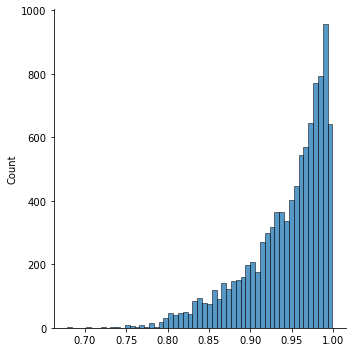

In [177]:
sns.displot(data=woman_woman_cos)

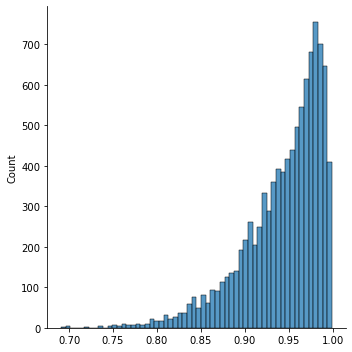

In [178]:
sns.displot(data=man_man_cos)

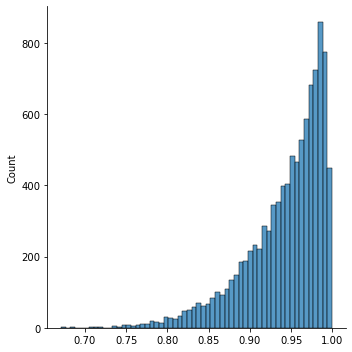

In [179]:
sns.displot(data=woman_man_cos)

2번 테스트 :  원본과 cut한 이미지의 hinge , chain 벡터 유사도

원본 vs 여백제거 chain vector 유사도 : 0.997836318284315
원본 vs 여백제거 hinge vector 유사도 : 0.9999326484558231
원본 vs 여백제거 chain+hinge vector 유사도 : 0.9978376224028601


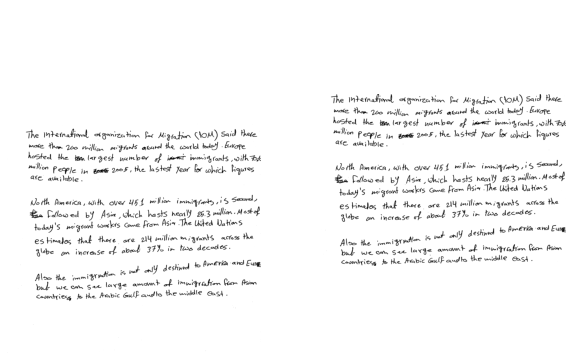

In [122]:
# test1 : cut한 사진에 여백이 별로 없음
img1 = cv2.imread('new/0001_4.jpg', cv2.IMREAD_GRAYSCALE)
img1 = cv2.adaptiveThreshold(img1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)

img2 = cv2.imread('cut/0001_4.jpg', cv2.IMREAD_GRAYSCALE)
img2 = cv2.adaptiveThreshold(img2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)


img1_chain = get_chain_code_features(img1)[0]
img2_chain = get_chain_code_features(img2)[0]

img1_hinge = get_hinge_features(img1)
img2_hinge = get_hinge_features(img2)

print('원본 vs 여백제거 chain vector 유사도 : ' +  str(dist(img1_chain,img2_chain)))
print('원본 vs 여백제거 hinge vector 유사도 : ' +  str(dist(img1_hinge,img2_hinge)))
print('원본 vs 여백제거 chain+hinge vector 유사도 : ' +  
      str(dist(np.concatenate([img1_chain,img1_hinge], axis=0),
               np.concatenate([img2_chain,img2_hinge], axis=0))))

plt.figure(figsize=(10,10))
plt.subplot(1,2,1)
plt.imshow(img1,cmap='gray')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(img2,cmap='gray')
plt.axis('off')
plt.show()

원본 vs 컷1 chain+hinge vector 유사도 : 0.9945719264957825
원본 vs 컷2 chain+hinge vector 유사도 : 0.9928283667293888
원본 vs 컷3 chain+hinge vector 유사도 : 0.9983026035719998
원본 vs 컷4 chain+hinge vector 유사도 : 0.9984339341540861


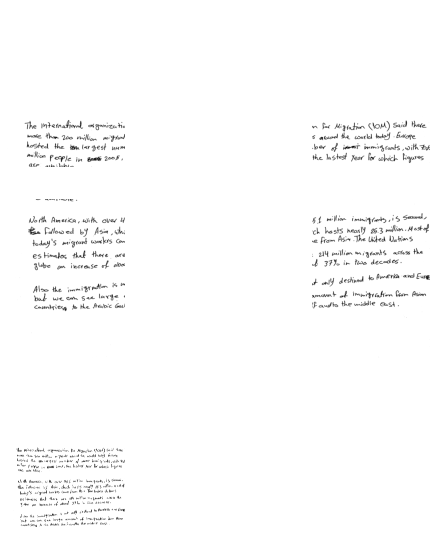

In [123]:
# test2 : 4컷으로 나눔
img = cv2.imread('new/0001_4.jpg', cv2.IMREAD_GRAYSCALE)
img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)


a , b = int(img.shape[0]/2) , int(img.shape[1]/2)
img_a= img[:a,:b]
img_b= img[:a,b:2*b]
img_c= img[a:2*a,:b]
img_d= img[a:2*a , b:2*b]

img_chain = get_chain_code_features(img1)[0]
img_a_chain = get_chain_code_features(img_a)[0]
img_b_chain = get_chain_code_features(img_b)[0]
img_c_chain = get_chain_code_features(img_c)[0]
img_d_chain = get_chain_code_features(img_d)[0]

img_hinge = get_hinge_features(img1)
img_a_hinge = get_hinge_features(img_a)
img_b_hinge = get_hinge_features(img_b)
img_c_hinge = get_hinge_features(img_c)
img_d_hinge = get_hinge_features(img_d)

print('원본 vs 컷1 chain+hinge vector 유사도 : ' +  
      str(dist(np.concatenate([img_chain,img_hinge], axis=0),
               np.concatenate([img_a_chain,img_a_hinge], axis=0))))
print('원본 vs 컷2 chain+hinge vector 유사도 : ' +  
      str(dist(np.concatenate([img_chain,img_hinge], axis=0),
               np.concatenate([img_b_chain,img_b_hinge], axis=0))))
print('원본 vs 컷3 chain+hinge vector 유사도 : ' +  
      str(dist(np.concatenate([img_chain,img_hinge], axis=0),
               np.concatenate([img_c_chain,img_c_hinge], axis=0))))
print('원본 vs 컷4 chain+hinge vector 유사도 : ' +  
      str(dist(np.concatenate([img_chain,img_hinge], axis=0),
               np.concatenate([img_d_chain,img_d_hinge], axis=0))))


plt.figure(figsize=(10,10))

plt.subplot(3,2,1)
plt.imshow(img_a,cmap='gray')
plt.axis('off')

plt.subplot(3,2,2)
plt.imshow(img_b,cmap='gray')
plt.axis('off')

plt.subplot(3,2,3)
plt.imshow(img_c,cmap='gray')
plt.axis('off')

plt.subplot(3,2,4)
plt.imshow(img_d,cmap='gray')
plt.axis('off')

plt.subplot(3,2,5)
plt.imshow(img,cmap='gray')
plt.axis('off')

plt.show()

잘라 놓은 사진의 픽셀 값 확인 : scatter

In [29]:
from_path = 'new_cut/'

x_width = []#세로길이
y_width = []#가로길이

for i in tqdm(range(1,476)):
    for j in range(1,5):
        image_path = str(i).zfill(4) + '_' + str(j) +'.jpg'
        img = cv2.imread(from_path + image_path, cv2.IMREAD_GRAYSCALE)
        x_width.append(img.shape[0])
        y_width.append(img.shape[1])

100%|██████████| 475/475 [00:16<00:00, 28.66it/s]


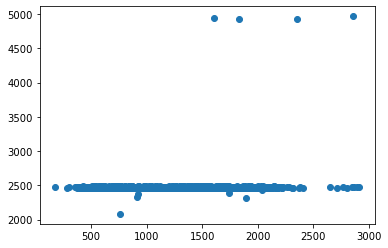

In [30]:
plt.scatter(x_width,y_width)
plt.show()

In [31]:
print(len(y_width))
for i,v in enumerate(y_width):
    if v>4000:
        print(i//4+1,i%4+1)

1900
200 1
200 2
200 3
200 4


200번은 가로 픽셀이 4000대임 , 그냥 해상도가 높음

(4943, 1605)


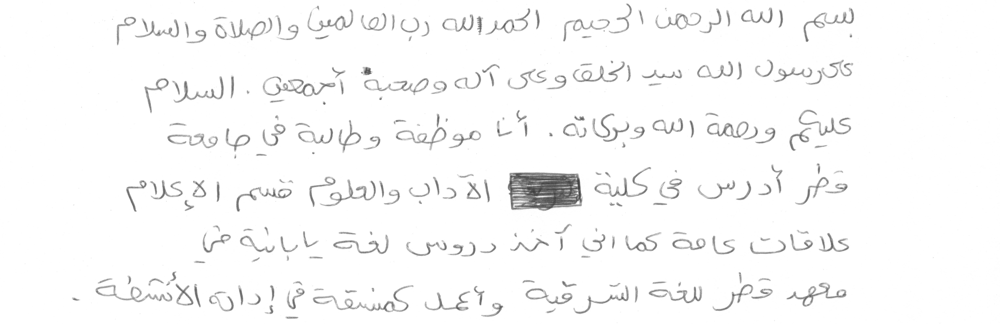

In [32]:
img = Image.open('new_cut/0200_1.jpg')
print(img.size)
img

(2471, 802)


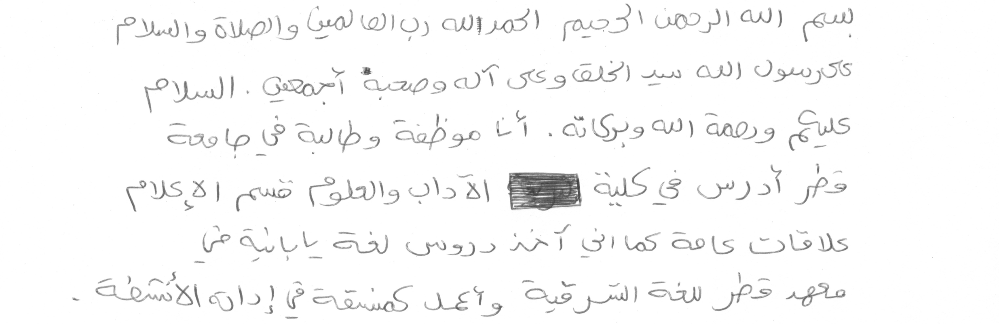

In [33]:
img = img.resize((img.size[0]//2,img.size[1]//2))
img.save('new_cut/0200_1.jpg')
print(img.size)
img

사진을 눈으로 비교해봤는데 똑같음ㅇㅇㅇㅇㅇㅇㅇ

In [34]:
#사이즈 변경
img = Image.open('new_cut/0200_2.jpg')
img = img.resize((img.size[0]//2,img.size[1]//2))
img.save('new_cut/0200_2.jpg')

img = Image.open('new_cut/0200_3.jpg')
img = img.resize((img.size[0]//2,img.size[1]//2))
img.save('new_cut/0200_3.jpg')

img = Image.open('new_cut/0200_4.jpg')
img = img.resize((img.size[0]//2,img.size[1]//2))
img.save('new_cut/0200_4.jpg')

100%|██████████| 475/475 [00:18<00:00, 25.62it/s]


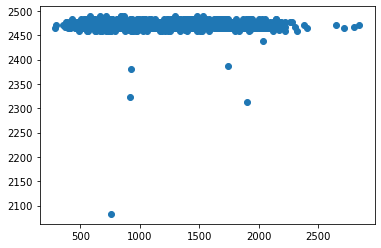

In [51]:
from_path = 'new_cut/'

x_width = []#세로길이
y_width = []#가로길이

for i in tqdm(range(1,476)):
    for j in range(1,5):
        image_path = str(i).zfill(4) + '_' + str(j) +'.jpg'
        img = cv2.imread(from_path + image_path, cv2.IMREAD_GRAYSCALE)
        x_width.append(img.shape[0])
        y_width.append(img.shape[1])
plt.scatter(x_width,y_width)
plt.show()

In [52]:
print(min(x_width),min(y_width))
print(max(x_width),max(y_width))

285 2083
2845 2489


세로 (위 아래)길이 최대인 사진 197 3


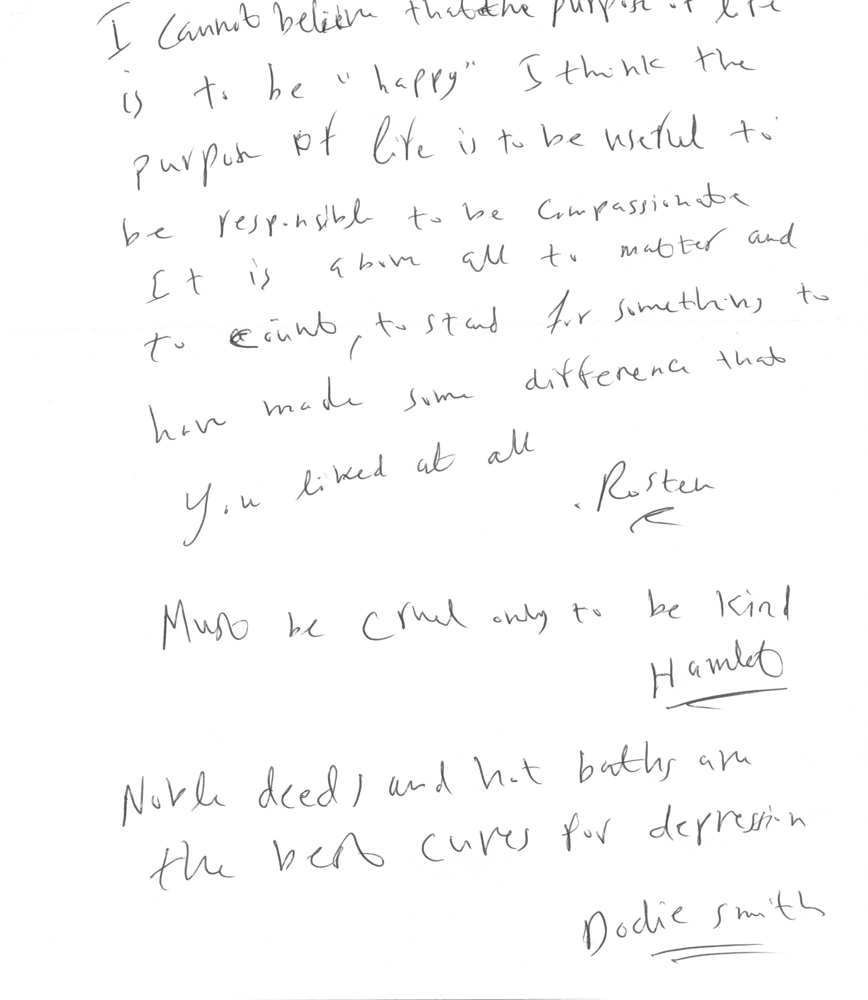

In [53]:
iidx , jidx = (x_width.index(max(x_width))//4+1) , (x_width.index(max(x_width))%4+1)
img = Image.open('new_cut/' + str(iidx).zfill(4) + '_' + str(jidx) + '.jpg')
print('세로 (위 아래)길이 최대인 사진' , iidx , jidx)
img

CNN에서 나눌 때 최소 285 * 2083 보단 작게 나눠야 한다.

상하 , 좌우 대칭

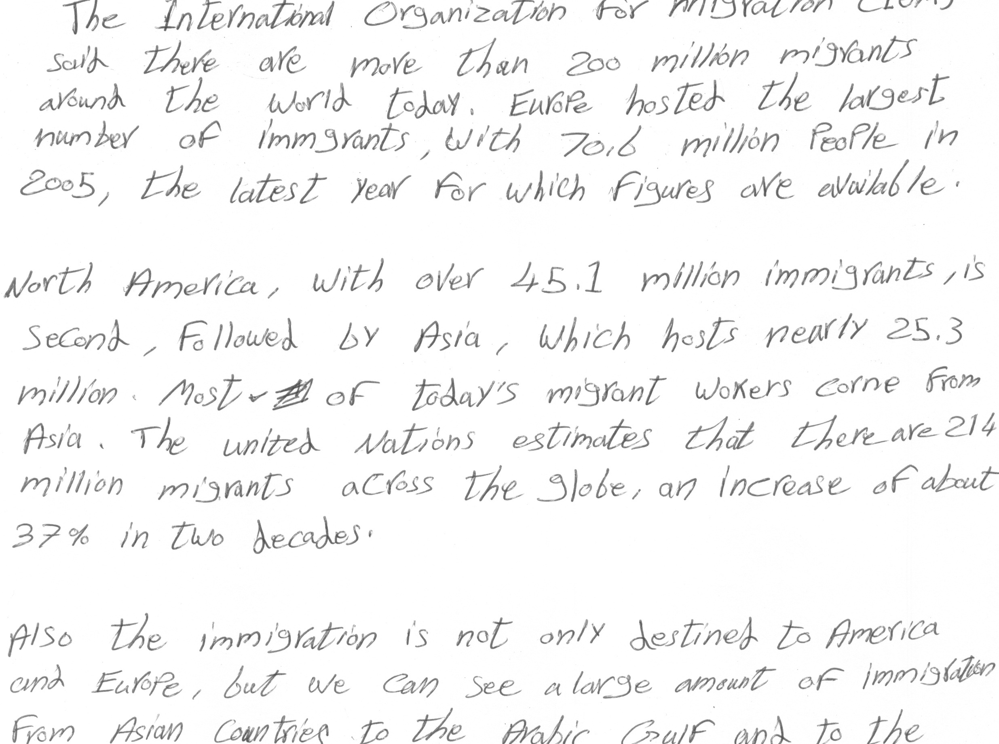

In [2]:
#원본
img = Image.open('new_cut/0111_4.jpg')
img

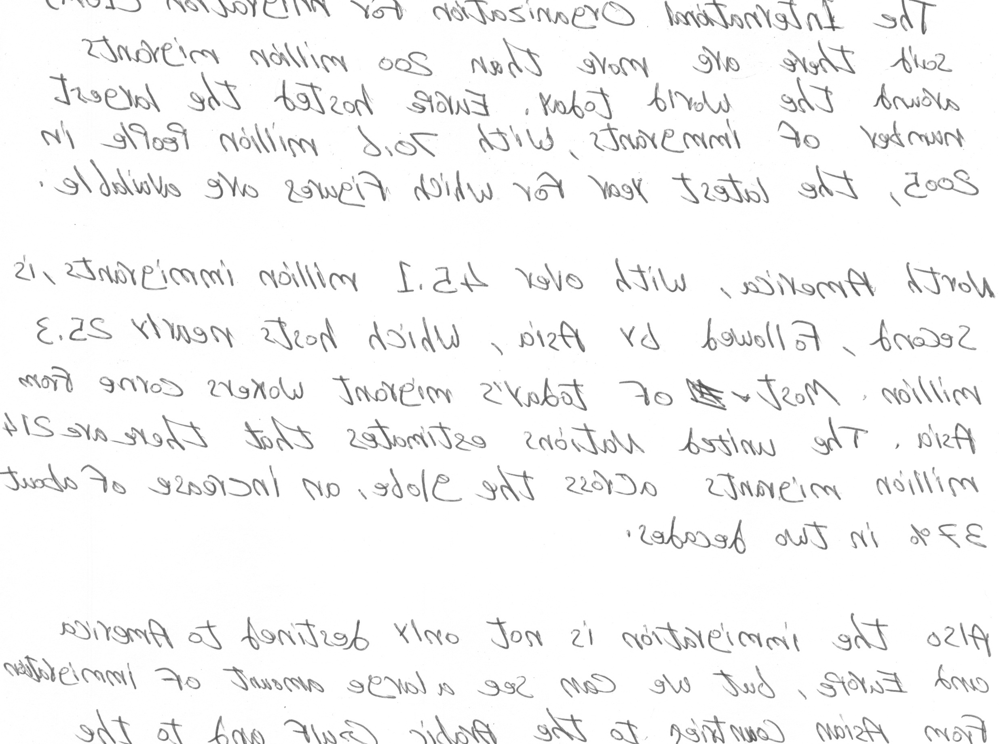

In [3]:
#좌우 반전
img1 = img.transpose(Image.FLIP_LEFT_RIGHT)
img1

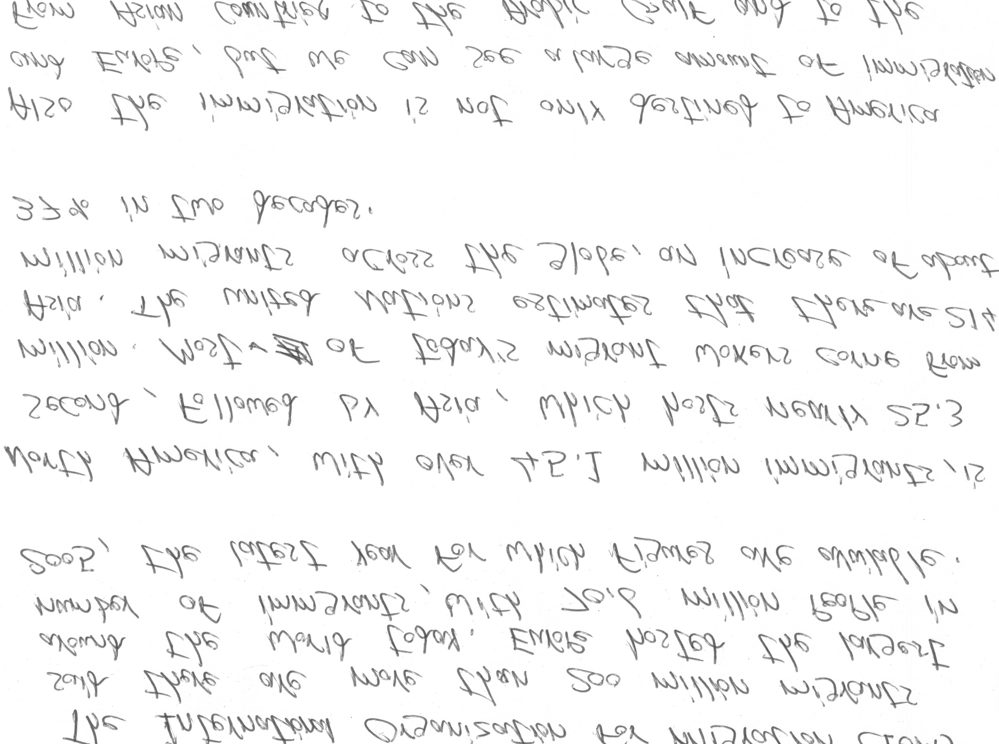

In [4]:
#상하 반전
img2 = img.transpose(Image.FLIP_TOP_BOTTOM)
img2

In [7]:
score_img, diff_img = compare_ssim(np.array(img), np.array(img1), full=True)
print('원본 과 좌우반전 유사도 : ' + str(score_img))

score_img, diff_img = compare_ssim(np.array(img), np.array(img2), full=True)
print('원본 과 상하반전 유사도 : ' + str(score_img))

score_img, diff_img = compare_ssim(np.array(img1), np.array(img2), full=True)
print('좌우반전 과 상하반전 유사도 : ' + str(score_img))

원본 과 좌우반전 유사도 : 0.6949175499449614
원본 과 상하반전 유사도 : 0.6698382536898622
좌우반전 과 상하반전 유사도 : 0.6711900510832259


In [8]:
img = np.array(img)
img1 = np.array(img1)
img2 = np.array(img2)


img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)
img_vector = np.concatenate((get_chain_code_features(img)[0],get_hinge_features(img)),axis=0)

img1 = cv2.adaptiveThreshold(img1, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)
img1_vector = np.concatenate((get_chain_code_features(img1)[0],get_hinge_features(img1)),axis=0)

img2 = cv2.adaptiveThreshold(img2, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)
img2_vector = np.concatenate((get_chain_code_features(img2)[0],get_hinge_features(img2)),axis=0)

In [11]:
print('원본 과 좌우반전 vector 유사도 : ' +  str(dist(img_vector,img1_vector)))
print('원본 과 상하반전 vector 유사도 : ' +  str(dist(img_vector,img2_vector)))
print('상하반전 과 좌우반전 vector 유사도 : ' +  str(dist(img2_vector,img1_vector)))

원본 과 좌우반전 vector 유사도 : 0.683640595790446
원본 과 상하반전 vector 유사도 : 0.6857705581577791
상하반전 과 좌우반전 vector 유사도 : 0.9984688731140479


똑같진 않지만 매우 유사하다 => 데이터 증강에는 4개로 나누거나 , 돌리는게 유의미 할 듯

사진 4등분 후 벡터 추출

In [4]:
from_path = 'new_cut/'

feature_list = []

for i in tqdm(range(1,476)):
    for j in range(1,5):
        image_path = str(i).zfill(4) + '_' + str(j) +'.jpg'
        img = Image.open(from_path + image_path)
        #이진화 
        img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)
        
        a , b = int(img.shape[0]/2) , int(img.shape[1]/2)
        img_a= img[:a,:b]
        img_b= img[:a,b:2*b]
        img_c= img[a:2*a,:b]
        img_d= img[a:2*a , b:2*b]
        
        img_a_chain = get_chain_code_features(img_a)[0]
        img_b_chain = get_chain_code_features(img_b)[0]
        img_c_chain = get_chain_code_features(img_c)[0]
        img_d_chain = get_chain_code_features(img_d)[0]

        img_a_hinge = get_hinge_features(img_a)
        img_b_hinge = get_hinge_features(img_b)
        img_c_hinge = get_hinge_features(img_c)
        img_d_hinge = get_hinge_features(img_d)
        
        img_a_v = np.concatenate([img_a_chain,img_a_hinge], axis=0)
        img_b_v = np.concatenate([img_b_chain,img_b_hinge], axis=0)
        img_c_v = np.concatenate([img_c_chain,img_c_hinge], axis=0)
        img_d_v = np.concatenate([img_d_chain,img_d_hinge], axis=0)
        
        if np.isfinite(img_a_v).all()==False or np.isfinite(img_b_v).all()==False or np.isfinite(img_c_v).all()==False or np.isfinite(img_d_v).all()==False:
            print(i,j)
            
        feature_list.append(img_a_v)
        feature_list.append(img_b_v)
        feature_list.append(img_c_v)
        feature_list.append(img_d_v)
                     
feature_list = np.array(feature_list)
print(feature_list.shape)
np.save('new_cut_4cutting_feature.npy',feature_list)

 69%|██████▉   | 328/475 [36:27<17:58,  7.34s/it]

329 3


100%|██████████| 475/475 [53:20<00:00,  6.74s/it]

(7600, 138)


In [9]:
np.isfinite(feature_list[5259]).all()

False

In [11]:
img = cv2.imread('new_cut/0329_3.jpg', cv2.IMREAD_GRAYSCALE)
#이진화 
img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)

a , b = int(img.shape[0]/2) , int(img.shape[1]/2)
img_c= img[a:2*a,:b]

img_c_chain = get_chain_code_features(img_c)[0]
img_c_hinge = get_hinge_features(img_c)

img_c_v = np.concatenate([img_c_chain,img_c_hinge], axis=0)

feature_list[5259] = img_c_v
np.save('new_cut_4cutting_feature.npy',feature_list)
np.isfinite(feature_list[5259]).all()

True

In [14]:
p = np.load('new_cut_4cutting_feature.npy')
np.isfinite(p).all()

True

In [13]:
from_path = 'new_cut/'

feature_list = []

for i in tqdm(range(1,476)):
    for j in range(1,5):
        image_path = str(i).zfill(4) + '_' + str(j) +'.jpg'
        #흑백으로 불러오기
        img = cv2.imread(from_path + image_path, cv2.IMREAD_GRAYSCALE)
        #이진화 
        img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY, 199, 5)
        
        img = Image.fromarray(img)
        img1 = img.transpose(Image.FLIP_LEFT_RIGHT)#좌우
        img2 = img.transpose(Image.FLIP_TOP_BOTTOM)#상하

        img_a = np.array(img1)
        img_b = np.array(img2)
        
        img_a_chain = get_chain_code_features(img_a)[0]
        img_b_chain = get_chain_code_features(img_b)[0]
    
        img_a_hinge = get_hinge_features(img_a)
        img_b_hinge = get_hinge_features(img_b)
       
        img_a_v = np.concatenate([img_a_chain,img_a_hinge], axis=0)
        img_b_v = np.concatenate([img_b_chain,img_b_hinge], axis=0)
      
        if np.isfinite(img_a_v).all()==False or np.isfinite(img_b_v).all()==False:
            print(i,j)
            
        feature_list.append(img_a_v)
        feature_list.append(img_b_v)
                     
feature_list = np.array(feature_list)
print(feature_list.shape)
np.save('new_cut_transpose_feature.npy',feature_list)

100%|██████████| 475/475 [1:28:50<00:00, 11.22s/it]

(3800, 138)


Image resize

In [30]:
img = cv2.imread('new/0010_4.jpg', cv2.IMREAD_GRAYSCALE)

In [31]:
img.shape

(3359, 2471)

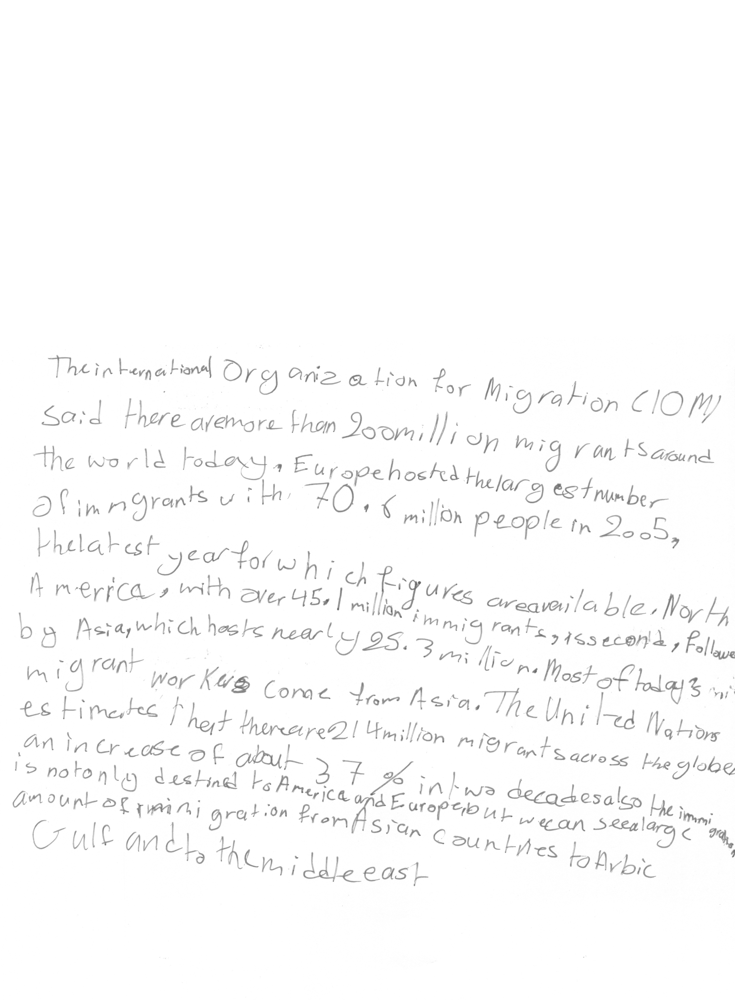

In [32]:
img1 = Image.fromarray(img)
img1

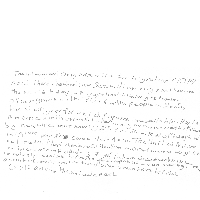

In [33]:
img2 = cv2.resize(img,(200,200))
img2 = Image.fromarray(img2)
img2

In [34]:
img2.shape

AttributeError: 'Image' object has no attribute 'shape'